**Problem Statement:**

Create a Recommender System to show personalized movie recommendations based on ratings given by a user and other users similar to them in order to improve user experience.

Data Dictionary:


RATINGS FILE DESCRIPTION

=========================================================================

All ratings are contained in the file "ratings.dat" and are in the following format:

UserID::MovieID::Rating::Timestamp

UserIDs range between 1 and 6040

MovieIDs range between 1 and 3952

Ratings are made on a 5-star scale (whole-star ratings only)

Timestamp is represented in seconds

Each user has at least 20 ratings

USERS FILE DESCRIPTION

=========================================================================

User information is in the file "users.dat" and is in the following format:

UserID::Gender::Age::Occupation::Zip-code

All demographic information is provided voluntarily by the users and is not checked for accuracy.
Only users who have provided some demographic information are included in this data set.

Gender is denoted by a "M" for male and "F" for female

Age is chosen from the following ranges:

1: "Under 18"

18: "18-24"

25: "25-34"

35: "35-44"

45: "45-49"

50: "50-55"

56: "56+"

Occupation is chosen from the following choices:

0: "other" or not specified

1: "academic/educator"

2: "artist"

3: "clerical/admin"

4: "college/grad student"

5: "customer service"

6: "doctor/health care"

7: "executive/managerial"

8: "farmer"

9: "homemaker"

10: "K-12 student"

11: "lawyer"

12: "programmer"

13: "retired"

14: "sales/marketing"

15: "scientist"

16: "self-employed"

17: "technician/engineer"

18: "tradesman/craftsman"

19: "unemployed"

20: "writer"

MOVIES FILE DESCRIPTION

=========================================================================

Movie information is in the file "movies.dat" and is in the following format:

MovieID::Title::Genres

Titles are identical to titles provided by the IMDB (including year of release)

Genres are pipe-separated and are selected from the following genres:

Action

Adventure

Animation

Children's

Comedy

Crime

Documentary

Drama

Fantasy

Film-Noir

Horror

Musical

Mystery

Romance

Sci-Fi

Thriller

War

Western


**Import Libraries:**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

**Set Options:**

In [ ]:
warnings.simplefilter('ignore')
pd.set_option("display.max_columns", None)
pd.options.display.float_format = '{:.2f}'.format
sns.set_style('white')


**Download datasets:**

In [ ]:
users=pd.read_csv("zee-users.dat", encoding='ISO-8859-1')
users.head()

,UserID::Gender::Age::Occupation::Zip-code
0,1::F::1::10::48067
1,2::M::56::16::70072
2,3::M::25::15::55117
3,4::M::45::7::02460
4,5::M::25::20::55455


In [ ]:
users= users.rename(columns={'::1':'Gender','::2':'Age','::3':'Occupation','::4':'Zip-code'})
users.head()

,UserID::Gender::Age::Occupation::Zip-code
0,1::F::1::10::48067
1,2::M::56::16::70072
2,3::M::25::15::55117
3,4::M::45::7::02460
4,5::M::25::20::55455


In [ ]:
users = users['UserID::Gender::Age::Occupation::Zip-code'].str.split('::', expand=True)
users.columns = ['UserID', 'Gender', 'Age', 'Occupation', 'Zip-code']
users.head()

,UserID,Gender,Age,Occupation,Zip-code
0,1,F,1,10,48067
1,2,M,56,16,70072
2,3,M,25,15,55117
3,4,M,45,7,02460
4,5,M,25,20,55455


In [ ]:
users['Age'].unique()

array(['1', '56', '25', '45', '50', '35', '18'], dtype=object)

In [ ]:
users.replace({'Age':{'1':  "Under 18",
                      '18':  "18-24",
                      '25':  "25-34",
                      '35':  "35-44",
                      '45':  "45-49",
                      '50':  "50-55",
                      '56':  "56 Above"}}, inplace=True)

In [ ]:
users.replace({'Occupation':{'0': "other",
                             '1': "academic/educator",
                             '2': "artist",
                             '3': "clerical/admin",
                             '4': "college/grad student",
                             '5': "customer service",
                             '6': "doctor/health care",
                             '7': "executive/managerial",
                             '8': "farmer",
                             '9': "homemaker",
                             '10': "k-12 student",
                             '11': "lawyer",
                             '12': "programmer",
                             '13': "retired",
                             '14': "sales/marketing",
                             '15': "scientist",
                             '16': "self-employed",
                             '17': "technician/engineer",
                             '18': "tradesman/craftsman",
                             '19': "unemployed",
                             '20': "writer"}}, inplace=True)

In [ ]:
users.head()

,UserID,Gender,Age,Occupation,Zip-code
0,1,F,Under 18,k-12 student,48067
1,2,M,56 Above,self-employed,70072
2,3,M,25-34,scientist,55117
3,4,M,45-49,executive/managerial,02460
4,5,M,25-34,writer,55455


In [ ]:
# Assuming 'ratings' DataFrame was created from "zee-ratings.dat" file
# and the columns are separated by '::'
ratings = pd.read_csv("zee-ratings.dat", delimiter='::', encoding='ISO-8859-1', header=None)
ratings.columns = ['UserID', 'MovieID', 'Rating', 'Timestamp']  # Assign column names



In [ ]:
ratings.head()

,UserID,MovieID,Rating,Timestamp
0,UserID,MovieID,Rating,Timestamp
1,1,1193,5,978300760
2,1,661,3,978302109
3,1,914,3,978301968
4,1,3408,4,978300275


In [ ]:
movies=pd.read_csv("zee-movies.dat",delimiter='::', encoding='ISO-8859-1', header=None)
movies.columns = ['MovieID', 'Title', 'Genres']
movies.head()

,MovieID,Title,Genres
0,Movie ID,Title,Genres
1,1,Toy Story (1995),Animation|Children's|Comedy
2,2,Jumanji (1995),Adventure|Children's|Fantasy
3,3,Grumpier Old Men (1995),Comedy|Romance
4,4,Waiting to Exhale (1995),Comedy|Drama


In [ ]:
df_1=pd.merge(movies, ratings, on='MovieID',how='inner')
df_1.head()

,MovieID,Title,Genres,UserID,Rating,Timestamp
0,1,Toy Story (1995),Animation|Children's|Comedy,1,5,978824268
1,1,Toy Story (1995),Animation|Children's|Comedy,6,4,978237008
2,1,Toy Story (1995),Animation|Children's|Comedy,8,4,978233496
3,1,Toy Story (1995),Animation|Children's|Comedy,9,5,978225952
4,1,Toy Story (1995),Animation|Children's|Comedy,10,5,978226474


In [ ]:
data= pd.merge(df_1, users, on='UserID',how='inner')
data.head()

,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code
0,1,Toy Story (1995),Animation|Children's|Comedy,1,5,978824268,F,Under 18,k-12 student,48067
1,1,Toy Story (1995),Animation|Children's|Comedy,6,4,978237008,F,50-55,homemaker,55117
2,1,Toy Story (1995),Animation|Children's|Comedy,8,4,978233496,M,25-34,programmer,11413
3,1,Toy Story (1995),Animation|Children's|Comedy,9,5,978225952,M,25-34,technician/engineer,61614
4,1,Toy Story (1995),Animation|Children's|Comedy,10,5,978226474,F,35-44,academic/educator,95370


**Performing EDA**

In [ ]:
data.shape

(1000209, 10)

No. of rows:  1000209

No. of columns:  10

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000209 entries, 0 to 1000208
Data columns (total 10 columns):
 #   Column      Non-Null Count    Dtype 
---  ------      --------------    ----- 
 0   MovieID     1000209 non-null  object
 1   Title       1000209 non-null  object
 2   Genres      1000209 non-null  object
 3   UserID      1000209 non-null  object
 4   Rating      1000209 non-null  object
 5   Timestamp   1000209 non-null  object
 6   Gender      1000209 non-null  object
 7   Age         1000209 non-null  object
 8   Occupation  1000209 non-null  object
 9   Zip-code    1000209 non-null  object
dtypes: object(10)
memory usage: 76.3+ MB


In [ ]:
data.isna().sum()

,0
MovieID,0
Title,0
Genres,0
UserID,0
Rating,0
Timestamp,0
Gender,0
Age,0
Occupation,0
Zip-code,0


There are no missing values

**Feature Engineering:**

In [ ]:
data['Datetime'] = pd.to_datetime(data['Timestamp'],
                                  unit='s')
data

,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,Datetime
0,1,Toy Story (1995),Animation|Children's|Comedy,1,5,978824268,F,Under 18,k-12 student,48067,2001-01-06 23:37:48
1,1,Toy Story (1995),Animation|Children's|Comedy,6,4,978237008,F,50-55,homemaker,55117,2000-12-31 04:30:08
2,1,Toy Story (1995),Animation|Children's|Comedy,8,4,978233496,M,25-34,programmer,11413,2000-12-31 03:31:36
3,1,Toy Story (1995),Animation|Children's|Comedy,9,5,978225952,M,25-34,technician/engineer,61614,2000-12-31 01:25:52
4,1,Toy Story (1995),Animation|Children's|Comedy,10,5,978226474,F,35-44,academic/educator,95370,2000-12-31 01:34:34
...,...,...,...,...,...,...,...,...,...,...,...
1000204,3952,"Contender, The (2000)",Drama|Thriller,5812,4,992072099,F,25-34,executive/managerial,92120,2001-06-09 07:34:59
1000205,3952,"Contender, The (2000)",Drama|Thriller,5831,3,986223125,M,25-34,academic/educator,92120,2001-04-02 14:52:05
1000206,3952,"Contender, The (2000)",Drama|Thriller,5837,4,1011902656,M,25-34,executive/managerial,60607,2002-01-24 20:04:16
1000207,3952,"Contender, The (2000)",Drama|Thriller,5927,1,979852537,M,35-44,sales/marketing,10003,2001-01-18 21:15:37


In [ ]:
data['ReleaseYear'] = data['Title'].str.split().str[-1]
data.head()

,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,Datetime,ReleaseYear
0,1,Toy Story (1995),Animation|Children's|Comedy,1,5,978824268,F,Under 18,k-12 student,48067,2001-01-06 23:37:48,(1995)
1,1,Toy Story (1995),Animation|Children's|Comedy,6,4,978237008,F,50-55,homemaker,55117,2000-12-31 04:30:08,(1995)
2,1,Toy Story (1995),Animation|Children's|Comedy,8,4,978233496,M,25-34,programmer,11413,2000-12-31 03:31:36,(1995)
3,1,Toy Story (1995),Animation|Children's|Comedy,9,5,978225952,M,25-34,technician/engineer,61614,2000-12-31 01:25:52,(1995)
4,1,Toy Story (1995),Animation|Children's|Comedy,10,5,978226474,F,35-44,academic/educator,95370,2000-12-31 01:34:34,(1995)


In [ ]:
data['ReleaseYear']= data['ReleaseYear'].str.lstrip('(').str.rstrip(")")
data.head()

,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,Datetime,ReleaseYear
0,1,Toy Story (1995),Animation|Children's|Comedy,1,5,978824268,F,Under 18,k-12 student,48067,2001-01-06 23:37:48,1995
1,1,Toy Story (1995),Animation|Children's|Comedy,6,4,978237008,F,50-55,homemaker,55117,2000-12-31 04:30:08,1995
2,1,Toy Story (1995),Animation|Children's|Comedy,8,4,978233496,M,25-34,programmer,11413,2000-12-31 03:31:36,1995
3,1,Toy Story (1995),Animation|Children's|Comedy,9,5,978225952,M,25-34,technician/engineer,61614,2000-12-31 01:25:52,1995
4,1,Toy Story (1995),Animation|Children's|Comedy,10,5,978226474,F,35-44,academic/educator,95370,2000-12-31 01:34:34,1995


In [ ]:
data['Title'] = data['Title'].str.replace(r' \(\d{4}\)', '', regex=True)
data.head()

,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,Datetime,ReleaseYear
0,1,Toy Story,Animation|Children's|Comedy,1,5,978824268,F,Under 18,k-12 student,48067,2001-01-06 23:37:48,1995
1,1,Toy Story,Animation|Children's|Comedy,6,4,978237008,F,50-55,homemaker,55117,2000-12-31 04:30:08,1995
2,1,Toy Story,Animation|Children's|Comedy,8,4,978233496,M,25-34,programmer,11413,2000-12-31 03:31:36,1995
3,1,Toy Story,Animation|Children's|Comedy,9,5,978225952,M,25-34,technician/engineer,61614,2000-12-31 01:25:52,1995
4,1,Toy Story,Animation|Children's|Comedy,10,5,978226474,F,35-44,academic/educator,95370,2000-12-31 01:34:34,1995


In [ ]:
data.ReleaseYear.unique()

array(['1995', '1994', '1996', '1976', '1993', '1992', '1988', '1967',
       '1964', '1977', '1965', '1982', '1962', '1990', '1991', '1989',
       '1937', '1940', '1969', '1981', '1973', '1970', '1960', '1955',
       '1956', '1959', '1968', '1980', '1975', '1948', '1943', '1963',
       '1950', '1987', '1997', '1974', '1958', '1972', '1998', '1952',
       '1951', '1957', '1961', '1954', '1934', '1944', '1942', '1941',
       '1953', '1939', '1947', '1946', '1945', '1938', '1935', '1936',
       '1926', '1949', '1932', '1930', '1971', '1979', '1986', '1966',
       '1978', '1985', '1983', '1984', '1933', '1931', '1922', '1927',
       '1929', '1928', '1999', '1925', '1919', '1923', '2000', '1920',
       '1921'], dtype=object)

In [ ]:
data['ReleaseYear'] = data['ReleaseYear'].astype('int32')

In [ ]:
data.describe()

,Datetime,ReleaseYear
count,1000209,1000209.00
mean,2000-10-22 19:41:35.404665088,1986.70
min,2000-04-25 23:05:32,1919.00
25%,2000-08-03 11:37:17,1982.00
50%,2000-10-31 18:46:46,1992.00
75%,2000-11-26 06:42:19,1997.00
max,2003-02-28 17:49:50,2000.00
std,NaN,14.35


Data is ranging from 1919 to 2000 year.. so creating bins to show release decade ..

In [ ]:
bins=[1919,1929,1939,1949,1959,1969,1979,1989,2009]
labels=['20s','30s','40s','50s','60s','70s','80s','90s']
data['ReleaseDecade']=pd.cut(data['ReleaseYear'],bins=bins,labels=labels)
data.head()

,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,Datetime,ReleaseYear,ReleaseDecade
0,1,Toy Story,Animation|Children's|Comedy,1,5,978824268,F,Under 18,k-12 student,48067,2001-01-06 23:37:48,1995,90s
1,1,Toy Story,Animation|Children's|Comedy,6,4,978237008,F,50-55,homemaker,55117,2000-12-31 04:30:08,1995,90s
2,1,Toy Story,Animation|Children's|Comedy,8,4,978233496,M,25-34,programmer,11413,2000-12-31 03:31:36,1995,90s
3,1,Toy Story,Animation|Children's|Comedy,9,5,978225952,M,25-34,technician/engineer,61614,2000-12-31 01:25:52,1995,90s
4,1,Toy Story,Animation|Children's|Comedy,10,5,978226474,F,35-44,academic/educator,95370,2000-12-31 01:34:34,1995,90s


In [ ]:
data.duplicated()

,0
0,False
1,False
2,False
3,False
4,False
...,...
1000204,False
1000205,False
1000206,False
1000207,False


No duplicate rows

**Data Visualization:**

**Distribution by Movie Rating:**

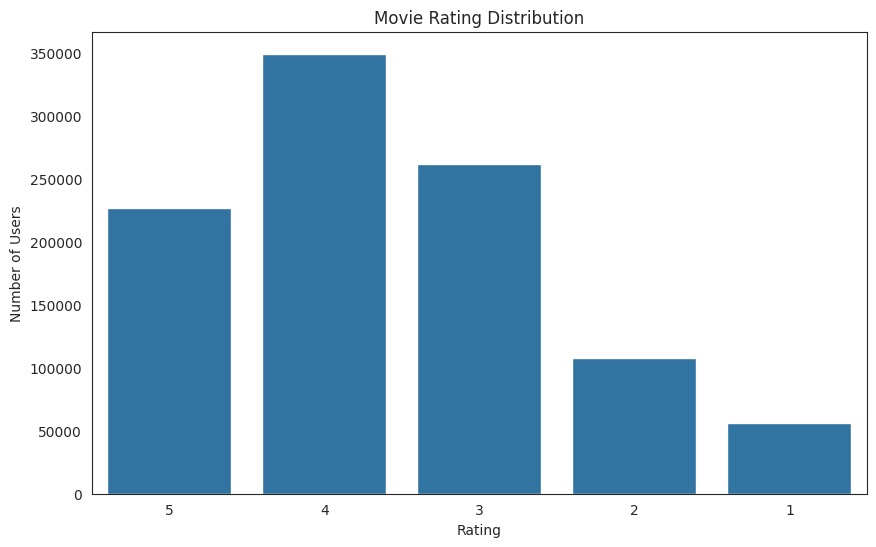

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(data=data,x='Rating')
plt.title('Movie Rating Distribution')
plt.xlabel('Rating')
plt.ylabel('Number of Users')
plt.show()


**Distribution by Age:**

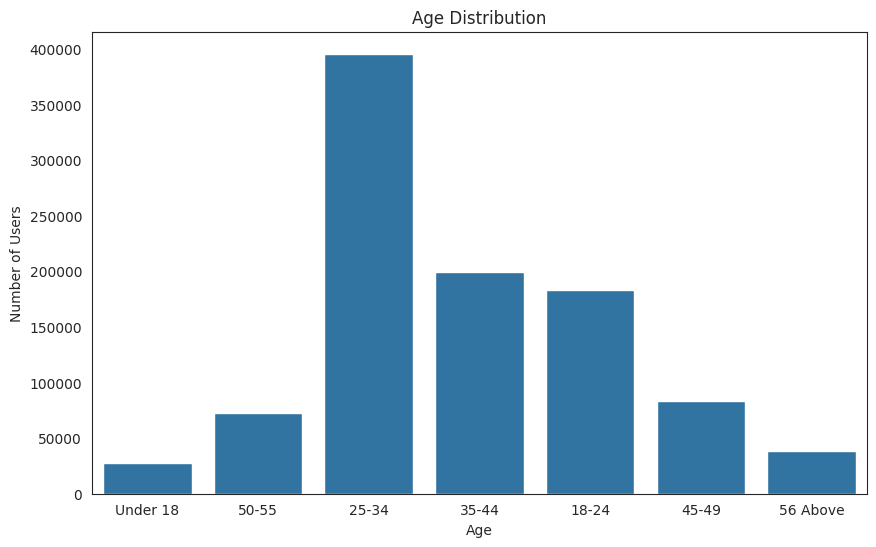

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(data=data,x='Age')
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Number of Users')
plt.show()

**Distribution by Gender:**

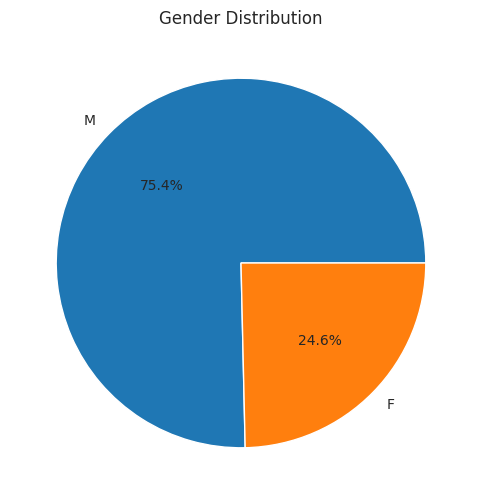

,count
Gender,
M,753769
F,246440


In [ ]:
x=data['Gender'].value_counts()
plt.figure(figsize=(10,6))
plt.pie(x,labels=x.index,autopct='%1.1f%%')
plt.title('Gender Distribution')
plt.show()
data['Gender'].value_counts()

**Distribution by Occupation:**

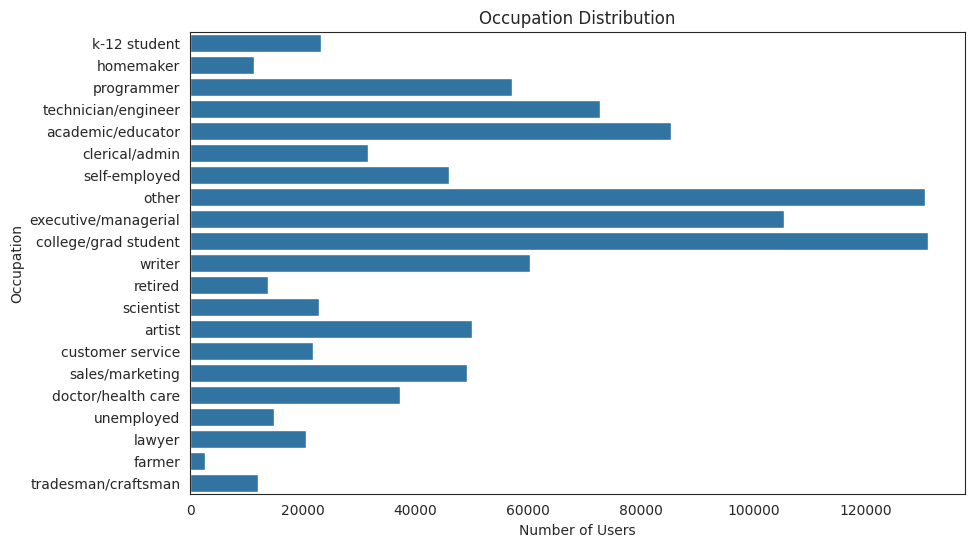

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(data=data,y='Occupation')
plt.title('Occupation Distribution')
plt.ylabel('Occupation')
plt.xlabel('Number of Users')
plt.show()

**Distribution by Year:**

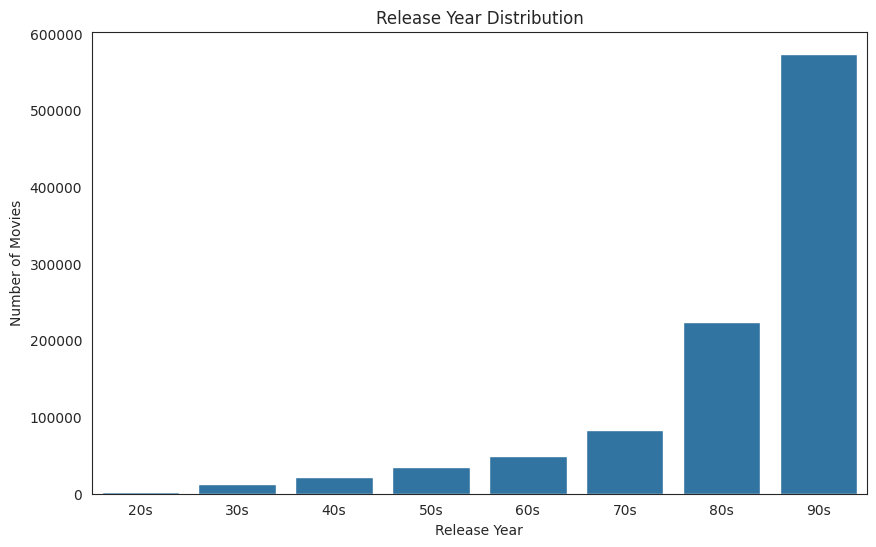

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(data=data,x='ReleaseDecade')
plt.title('Release Year Distribution')
plt.xlabel('Release Year')
plt.ylabel('Number of Movies')
plt.show()

In [ ]:
data.head()

,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,Datetime,ReleaseYear,ReleaseDecade
0,1,Toy Story,Animation|Children's|Comedy,1,5,978824268,F,Under 18,k-12 student,48067,2001-01-06 23:37:48,1995,90s
1,1,Toy Story,Animation|Children's|Comedy,6,4,978237008,F,50-55,homemaker,55117,2000-12-31 04:30:08,1995,90s
2,1,Toy Story,Animation|Children's|Comedy,8,4,978233496,M,25-34,programmer,11413,2000-12-31 03:31:36,1995,90s
3,1,Toy Story,Animation|Children's|Comedy,9,5,978225952,M,25-34,technician/engineer,61614,2000-12-31 01:25:52,1995,90s
4,1,Toy Story,Animation|Children's|Comedy,10,5,978226474,F,35-44,academic/educator,95370,2000-12-31 01:34:34,1995,90s


**Grouping Data:**

In [ ]:
data['Rating']=data['Rating'].fillna(0).astype('int32')

In [ ]:
df = pd.DataFrame(data.groupby('Title')['Rating'].agg([('Avg rating', 'mean')]))
df['No. of ratings'] = pd.DataFrame(data.groupby('Title')['Rating'].count())

In [ ]:
df.sample(10)

,Avg rating,No. of ratings
Title,,
Cimarron,3.38,29
His Girl Friday,4.25,397
Diamonds,2.44,9
Secrets & Lies,4.04,474
Living Out Loud,3.22,179
Balto,3.26,99
Ever After: A Cinderella Story,3.71,416
Bitter Sugar (Azucar Amargo),3.27,11
And God Created Woman (Et Dieu&#8230;Créa la Femme),3.39,28


In [ ]:
df.sort_values(by='No. of ratings', ascending=False).head(10)

,Avg rating,No. of ratings
Title,,
American Beauty,4.32,3428
Star Wars: Episode IV - A New Hope,4.45,2991
Star Wars: Episode V - The Empire Strikes Back,4.29,2990
Star Wars: Episode VI - Return of the Jedi,4.02,2883
Jurassic Park,3.76,2672
Saving Private Ryan,4.34,2653
Terminator 2: Judgment Day,4.06,2649
"Matrix, The",4.32,2590
Back to the Future,3.99,2583


American Beauty got maximum number of Ratings

**Pivot Table:**

In [ ]:
mat= pd.pivot_table(data=data,values='Rating',index='UserID',columns='Title')
mat.head()

Title   $1,000,000 Duck  'Night Mother  'Til There Was You  'burbs, The  \
UserID                                                                    
1                   NaN            NaN                 NaN          NaN   
10                  NaN            NaN                 NaN         4.00   
100                 NaN            NaN                 NaN          NaN   
1000                NaN            NaN                 NaN          NaN   
1001                NaN            NaN                 NaN          NaN   

Title   ...And Justice for All  1-900  10 Things I Hate About You  \
UserID                                                              
1                          NaN    NaN                         NaN   
10                         NaN    NaN                         NaN   
100                        NaN    NaN                         NaN   
1000                       NaN    NaN                         NaN   
1001                       NaN    NaN                         NaN   

Title   101 Dalmatians  12 Angry Men  13th Warrior, The  187  \
UserID                                                         
1                  NaN           NaN                NaN  NaN   
10                 NaN          3.00               4.00  NaN   
100                NaN           NaN                NaN  NaN   
1000              4.00           NaN                NaN  NaN   
1001              3.00           NaN                NaN  NaN   

Title   2 Days in the Valley  20 Dates  20,000 Leagues Under the Sea  \
UserID                                                                 
1                        NaN       NaN                           NaN   
10                       NaN       NaN                          4.00   
100                      NaN       NaN                           NaN   
1000                     NaN       NaN                           NaN   
1001                     NaN       NaN                           NaN   

Title   200 Cigarettes  2001: A Space Odyssey  2010  24 7: Twenty Four Seven  \
UserID                                                                         
1                  NaN                    NaN   NaN                      NaN   
10                 NaN                   3.00   NaN                      NaN   
100                NaN                   4.00   NaN                      NaN   
1000               NaN                    NaN   NaN                      NaN   
1001              1.00                    NaN   NaN                      NaN   

Title   24-hour Woman  28 Days  3 Ninjas: High Noon On Mega Mountain  \
UserID                                                                 
1                 NaN      NaN                                   NaN   
10                NaN      NaN                                   NaN   
100               NaN      NaN                                   NaN   
1000              NaN      NaN                                   NaN   
1001              NaN      NaN                                   NaN   

Title   3 Strikes  301, 302  39 Steps, The  \
UserID                                       
1             NaN       NaN            NaN   
10            NaN       NaN            NaN   
100           NaN       NaN            NaN   
1000          NaN       NaN            NaN   
1001          NaN       NaN            NaN   

Title   400 Blows, The (Les Quatre cents coups)  42 Up  52 Pick-Up   54  \
UserID                                                                    
1                                           NaN    NaN         NaN  NaN   
10                                          NaN    NaN         NaN  NaN   
100                                         NaN    NaN         NaN  NaN   
1000                                        NaN    NaN         NaN  NaN   
1001                                        NaN    NaN         NaN 2.00   

Title   7th Voyage of Sinbad, The  8 1/2  8 1/2 Women  \
UserID                                                  
1      

In [ ]:
mat.fillna(0,inplace=True)
mat.head()

Title   $1,000,000 Duck  'Night Mother  'Til There Was You  'burbs, The  \
UserID                                                                    
1                  0.00           0.00                0.00         0.00   
10                 0.00           0.00                0.00         4.00   
100                0.00           0.00                0.00         0.00   
1000               0.00           0.00                0.00         0.00   
1001               0.00           0.00                0.00         0.00   

Title   ...And Justice for All  1-900  10 Things I Hate About You  \
UserID                                                              
1                         0.00   0.00                        0.00   
10                        0.00   0.00                        0.00   
100                       0.00   0.00                        0.00   
1000                      0.00   0.00                        0.00   
1001                      0.00   0.00                        0.00   

Title   101 Dalmatians  12 Angry Men  13th Warrior, The  187  \
UserID                                                         
1                 0.00          0.00               0.00 0.00   
10                0.00          3.00               4.00 0.00   
100               0.00          0.00               0.00 0.00   
1000              4.00          0.00               0.00 0.00   
1001              3.00          0.00               0.00 0.00   

Title   2 Days in the Valley  20 Dates  20,000 Leagues Under the Sea  \
UserID                                                                 
1                       0.00      0.00                          0.00   
10                      0.00      0.00                          4.00   
100                     0.00      0.00                          0.00   
1000                    0.00      0.00                          0.00   
1001                    0.00      0.00                          0.00   

Title   200 Cigarettes  2001: A Space Odyssey  2010  24 7: Twenty Four Seven  \
UserID                                                                         
1                 0.00                   0.00  0.00                     0.00   
10                0.00                   3.00  0.00                     0.00   
100               0.00                   4.00  0.00                     0.00   
1000              0.00                   0.00  0.00                     0.00   
1001              1.00                   0.00  0.00                     0.00   

Title   24-hour Woman  28 Days  3 Ninjas: High Noon On Mega Mountain  \
UserID                                                                 
1                0.00     0.00                                  0.00   
10               0.00     0.00                                  0.00   
100              0.00     0.00                                  0.00   
1000             0.00     0.00                                  0.00   
1001             0.00     0.00                                  0.00   

Title   3 Strikes  301, 302  39 Steps, The  \
UserID                                       
1            0.00      0.00           0.00   
10           0.00      0.00           0.00   
100          0.00      0.00           0.00   
1000         0.00      0.00           0.00   
1001         0.00      0.00           0.00   

Title   400 Blows, The (Les Quatre cents coups)  42 Up  52 Pick-Up   54  \
UserID                                                                    
1                                          0.00   0.00        0.00 0.00   
10                                         0.00   0.00        0.00 0.00   
100                                        0.00   0.00        0.00 0.00   
1000                                       0.00   0.00        0.00 0.00   
1001                                       0.00   0.00        0.00 2.00   

Title   7th Voyage of Sinbad, The  8 1/2  8 1/2 Women  \
UserID                                                  
1      

**Recommendations systems**





**User-Interaction Matrix**
Creating a pivot table of movie titles and userid and ratings are taken as values.

In [ ]:
matrix = pd.pivot_table(data, index='UserID', columns='Title', values='Rating', aggfunc='mean')
matrix.fillna(0, inplace=True) # Imputing 'NaN' values with Zero rating

print(matrix.shape)

matrix.head(10)

(6040, 3664)


Title   $1,000,000 Duck  'Night Mother  'Til There Was You  'burbs, The  \
UserID                                                                    
1                  0.00           0.00                0.00         0.00   
10                 0.00           0.00                0.00         4.00   
100                0.00           0.00                0.00         0.00   
1000               0.00           0.00                0.00         0.00   
1001               0.00           0.00                0.00         0.00   
1002               0.00           0.00                0.00         0.00   
1003               0.00           0.00                0.00         0.00   
1004               0.00           0.00                0.00         0.00   
1005               0.00           0.00                0.00         0.00   
1006               0.00           0.00                0.00         0.00   

Title   ...And Justice for All  1-900  10 Things I Hate About You  \
UserID                                                              
1                         0.00   0.00                        0.00   
10                        0.00   0.00                        0.00   
100                       0.00   0.00                        0.00   
1000                      0.00   0.00                        0.00   
1001                      0.00   0.00                        0.00   
1002                      0.00   0.00                        0.00   
1003                      0.00   0.00                        0.00   
1004                      0.00   0.00                        0.00   
1005                      0.00   0.00                        0.00   
1006                      0.00   0.00                        0.00   

Title   101 Dalmatians  12 Angry Men  13th Warrior, The  187  \
UserID                                                         
1                 0.00          0.00               0.00 0.00   
10                0.00          3.00               4.00 0.00   
100               0.00          0.00               0.00 0.00   
1000              4.00          0.00               0.00 0.00   
1001              3.00          0.00               0.00 0.00   
1002              0.00          0.00               0.00 0.00   
1003              0.00          0.00               0.00 0.00   
1004              4.00          0.00               0.00 0.00   
1005              0.00          0.00               0.00 0.00   
1006              0.00          0.00               0.00 0.00   

Title   2 Days in the Valley  20 Dates  20,000 Leagues Under the Sea  \
UserID                                                                 
1                       0.00      0.00                          0.00   
10                      0.00      0.00                          4.00   
100                     0.00      0.00                          0.00   
1000                    0.00      0.00                          0.00   
1001                    0.00      0.00                          0.00   
1002                    0.00      0.00                          0.00   
1003                    0.00      0.00                          0.00   
1004                    0.00      0.00                          0.00   
1005                    0.00      0.00                          0.00   
1006                    0.00      0.00                          0.00   

Title   200 Cigarettes  2001: A Space Odyssey  2010  24 7: Twenty Four Seven  \
UserID                                                                         
1                 0.00                   0.00  0.00                     0.00   
10                0.00                   3.00  0.00                     0.00   
100               0.00                   4.00  0.00                     0.00   
1000              0.00                   0.00  0.00                     0.00   
1001              1.00                   0.00  0.00                     0.00   
1002              0.00                   0.00  0.00                     0.00

In [ ]:
# Checking data sparsity
n_users = data['UserID'].nunique()
n_movies = data['MovieID'].nunique()
sparsity = round(1.0 - data.shape[0] / float( n_users * n_movies), 3)
print('The sparsity level of dataset is ' +  str(sparsity * 100) + '%')

The sparsity level of dataset is 95.5%


**Pearson Correlation:**

Correlation is a measure that tells how closely two variables move in the same or opposite direction. A positive value indicates that they move in the same direction (i.e. if one increases other increases), where as a negative value indicates the opposite.

The most popular correlation measure for numerical data is Pearson’s Correlation. This measures the degree of linear relationship between two numeric variables and lies between -1 to +1. It is represented by ‘r’.

r=1 means perfect positive correlation
r=-1 means perfect negative correlation
r=0 means no linear correlation (note, it does not mean no correlation)

Item - Based approach

We will take a movie name as an input from the user and see which other 5 (five) movies have maximum correlation with it.

In [ ]:
movie_name = input("Enter a movie name: ")
movie_rating = mat[movie_name]

Enter a movie name: Liar Liar


In [ ]:
similar_movies = mat.corrwith(movie_rating)

In [ ]:
sim_df = pd.DataFrame(similar_movies, columns=['Correlation'])
sim_df.sort_values('Correlation', ascending=False, inplace=True)

In [ ]:
sim_df.iloc[1:,:].head()

,Correlation
Title,
Mrs. Doubtfire,0.50
Dumb & Dumber,0.46
Ace Ventura: Pet Detective,0.46
Home Alone,0.46
"Wedding Singer, The",0.43


:

**Cosine Similarity**

Cosine similarity is a measure of similarity between two sequences of numbers. Those sequences are viewed as vectors in a higher dimensional space, and the cosine similarity is defined as the cosine of the angle between them, i.e. the dot product of the vectors divided by the product of their lengths.

The cosine similarity always belongs to the interval [-1,1]. For example, two proportional vectors have a cosine similarity of 1, two orthogonal vectors have a similarity of 0, and two opposite vectors have a similarity of -1.

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
item_similarity = cosine_similarity(mat.T)
print(item_similarity)

[[1.         0.07235746 0.03701053 ... 0.         0.12024178 0.02700277]
 [0.07235746 1.         0.11528952 ... 0.         0.         0.07780705]
 [0.03701053 0.11528952 1.         ... 0.         0.04752635 0.0632837 ]
 ...
 [0.         0.         0.         ... 1.         0.         0.04564448]
 [0.12024178 0.         0.04752635 ... 0.         1.         0.04433508]
 [0.02700277 0.07780705 0.0632837  ... 0.04564448 0.04433508 1.        ]]


Item Similarity Matrix:



In [ ]:
item_sim_matrix=pd.DataFrame(item_similarity,index=mat.columns,columns=mat.columns)
item_sim_matrix.head()

Title                   $1,000,000 Duck  'Night Mother  'Til There Was You  \
Title                                                                        
$1,000,000 Duck                    1.00           0.07                0.04   
'Night Mother                      0.07           1.00                0.12   
'Til There Was You                 0.04           0.12                1.00   
'burbs, The                        0.08           0.12                0.10   
...And Justice for All             0.06           0.16                0.07   

Title                   'burbs, The  ...And Justice for All  1-900  \
Title                                                                
$1,000,000 Duck                0.08                    0.06   0.00   
'Night Mother                  0.12                    0.16   0.00   
'Til There Was You             0.10                    0.07   0.08   
'burbs, The                    1.00                    0.14   0.00   
...And Justice for All         0.14                    1.00   0.00   

Title                   10 Things I Hate About You  101 Dalmatians  \
Title                                                                
$1,000,000 Duck                               0.06            0.19   
'Night Mother                                 0.08            0.14   
'Til There Was You                            0.13            0.13   
'burbs, The                                   0.19            0.25   
...And Justice for All                        0.08            0.18   

Title                   12 Angry Men  13th Warrior, The  187  \
Title                                                          
$1,000,000 Duck                 0.09               0.06 0.03   
'Night Mother                   0.11               0.05 0.06   
'Til There Was You              0.08               0.07 0.02   
'burbs, The                     0.17               0.20 0.10   
...And Justice for All          0.21               0.12 0.11   

Title                   2 Days in the Valley  20 Dates  \
Title                                                    
$1,000,000 Duck                         0.02      0.02   
'Night Mother                           0.11      0.04   
'Til There Was You                      0.07      0.09   
'burbs, The                             0.18      0.05   
...And Justice for All                  0.20      0.04   

Title                   20,000 Leagues Under the Sea  200 Cigarettes  \
Title                                                                  
$1,000,000 Duck                                 0.14            0.09   
'Night Mother                                   0.07            0.14   
'Til There Was You                              0.03            0.20   
'burbs, The                                     0.19            0.24   
...And Justice for All                          0.17            0.11   

Title                   2001: A Space Odyssey  2010  24 7: Twenty Four Seven  \
Title                                                                          
$1,000,000 Duck                          0.07  0.04                     0.00   
'Night Mother                            0.10  0.08                     0.06   
'Til There Was You                       0.06  0.04                     0.00   
'burbs, The                              0.20  0.19                     0.00   
...And Justice for All                   0.22  0.15                     0.08   

Title                   24-hour Woman  28 Days  \
Title                                            
$1,000,000 Duck                  0.00     0.06   
'Night Mother                    0.06     0.06   
'Til There Was You               0.17     0.12   
'burbs, The                      0.04     0.12   
...And Justice for All           0.02     0.09   

Title                   3 Ninjas: High Noon On Mega Mountain  3 Strikes  \
Title                                                                     
$1,000,000 Duck                                 

User Similarity matrix

In [ ]:
user_similarity = cosine_similarity(mat)
print(user_similarity)
user_sim_matrix=pd.DataFrame(user_similarity,index=mat.index,columns=mat.index)
user_sim_matrix.head()

[[1.         0.2547356  0.12396703 ... 0.15926709 0.11935626 0.12239079]
 [0.2547356  1.         0.25905171 ... 0.16532118 0.13302222 0.24788299]
 [0.12396703 0.25905171 1.         ... 0.20430203 0.11352239 0.30693676]
 ...
 [0.15926709 0.16532118 0.20430203 ... 1.         0.18657496 0.18563871]
 [0.11935626 0.13302222 0.11352239 ... 0.18657496 1.         0.10827118]
 [0.12239079 0.24788299 0.30693676 ... 0.18563871 0.10827118 1.        ]]


UserID    1   10  100  1000  1001  1002  1003  1004  1005  1006  1007  1008  \
UserID                                                                        
1      1.00 0.25 0.12  0.21  0.14  0.11  0.12  0.18  0.10  0.05  0.06  0.10   
10     0.25 1.00 0.26  0.28  0.16  0.11  0.14  0.43  0.19  0.10  0.16  0.22   
100    0.12 0.26 1.00  0.31  0.08  0.11  0.36  0.24  0.17  0.10  0.06  0.04   
1000   0.21 0.28 0.31  1.00  0.10  0.05  0.20  0.36  0.32  0.13  0.04  0.08   
1001   0.14 0.16 0.08  0.10  1.00  0.16  0.05  0.15  0.14  0.13  0.02  0.08   

UserID  1009  101  1010  1011  1012  1013  1014  1015  1016  1017  1018  1019  \
UserID                                                                          
1       0.05 0.03  0.16  0.08  0.08  0.05  0.20  0.18  0.13  0.15  0.18  0.11   
10      0.12 0.20  0.35  0.20  0.15  0.16  0.16  0.39  0.20  0.29  0.24  0.34   
100     0.06 0.35  0.26  0.14  0.09  0.02  0.29  0.20  0.17  0.14  0.34  0.19   
1000    0.12 0.28  0.25  0.12  0.12  0.05  0.18  0.22  0.09  0.20  0.36  0.20   
1001    0.20 0.07  0.25  0.07  0.04  0.07  0.06  0.30  0.29  0.10  0.07  0.17   

UserID  102  1020  1021  1022  1023  1024  1025  1026  1027  1028  1029  103  \
UserID                                                                         
1      0.12  0.03  0.09  0.12  0.10  0.02  0.03  0.00  0.14  0.05  0.19 0.03   
10     0.16  0.11  0.19  0.11  0.13  0.14  0.08  0.04  0.15  0.08  0.30 0.15   
100    0.01  0.18  0.20  0.07  0.09  0.07  0.07  0.03  0.21  0.10  0.16 0.22   
1000   0.10  0.14  0.17  0.06  0.05  0.02  0.12  0.03  0.15  0.07  0.22 0.17   
1001   0.17  0.15  0.09  0.27  0.05  0.07  0.12  0.13  0.08  0.05  0.15 0.10   

UserID  1030  1031  1032  1033  1034  1035  1036  1037  1038  1039  104  1040  \
UserID                                                                          
1       0.05  0.06  0.18  0.03  0.19  0.14  0.14  0.02  0.18  0.03 0.05  0.17   
10      0.24  0.27  0.23  0.20  0.33  0.13  0.17  0.05  0.18  0.06 0.09  0.33   
100     0.40  0.39  0.09  0.14  0.16  0.22  0.19  0.05  0.13  0.00 0.03  0.23   
1000    0.34  0.32  0.14  0.13  0.23  0.13  0.13  0.06  0.09  0.00 0.07  0.23   
1001    0.09  0.08  0.23  0.10  0.15  0.10  0.08  0.20  0.16  0.08 0.13  0.13   

UserID  1041  1042  1043  1044  1045  1046  1047  1048  1049  105  1050  1051  \
UserID                                                                          
1       0.04  0.08  0.08  0.14  0.06  0.03  0.14  0.15  0.07 0.10  0.14  0.25   
10      0.08  0.25  0.10  0.22  0.10  0.13  0.26  0.10  0.11 0.15  0.28  0.46   
100     0.08  0.05  0.09  0.19  0.00  0.09  0.26  0.14  0.18 0.26  0.16  0.21   
1000    0.04  0.05  0.06  0.26  0.04  0.09  0.20  0.05  0.09 0.45  0.14  0.24   
1001    0.08  0.02  0.06  0.02  0.14  0.05  0.14  0.19  0.14 0.05  0.37  0.31   

UserID  1052  1053  1054  1055  1056  1057  1058  1059  106  1060  1061  1062  \
UserID                                                                          
1       0.06  0.05  0.05  0.14  0.06  0.21  0.12  0.21 0.05  0.00  0.18  0.15   
10      0.14  0.19  0.23  0.19  0.14  0.30  0.34  0.34 0.17  0.11  0.16  0.29   
100     0.05  0.27  0.11  0.05  0.04  0.25  0.31  0.21 0.09  0.11  0.05  0.08   
1000    0.02  0.33  0.15  0.11  0.16  0.29  0.28  0.21 0.06  0.10  0.20  0.20   
1001    0.05  0.15  0.13  0.17  0.04  0.17  0.25  0.25 0.07  0.13  0.08  0.11   

UserID  1063  1064  1065  1066  1067  1068  1069  107  1070  1071  1072  1073  \
UserID                                                                          
1       0.10  0.12  0.03  0.10  0.12  0.24  0.03 0.12  0.04  0.07  0.23  0.07   
10      0.25  0.20  0.13  0.28  0.20  0.39  0.12 0.19  0.02  0.19  0.24  0.17   
100     0.25  0.17  0.03  0.20  0.18  0.19  0.10 0.17  0.13  0.19  0.17  0.13   
1000    0.30  0.15  0.01  0.14  0.11  0.18  0.04 0.13  0.04  0.11  0.17  0.09   
1001    0.14  0.24  0.21  0.13  0.17  0.23  0.29 0.04  0.08  0.12  0.15  0.11   

UserID  1074  1075  1076  1077  1078  1079  1

**Nearest Neighbors:**

In [ ]:
from sklearn.neighbors import NearestNeighbors
from scipy import sparse

In [ ]:
csr_mat=sparse.csr_matrix(mat.T.values)
csr_mat.data

array([3., 5., 4., ..., 4., 4., 3.])

**Sparse Data:** is a data set where most of the item values are zero.
SciPy has a module, scipy.sparse that provides functions to deal with sparse data.

There are primarily two types of sparse matrices that we use:

CSC - Compressed Sparse Column. For efficient arithmetic, fast column slicing.

CSR - Compressed Sparse Row. For fast row slicing, faster matrix vector products

We will use the CSR matrix in this context


A compressed sparse row (CSR) matrix 'M' is represented by three (one-dimensional) arrays, that respectively contain nonzero values, the extents of rows, and column indices.
The CSR format stores a sparse m × n matrix M in row form using three (one-dimensional) arrays (V, COL_INDEX, ROW_INDEX).



For example -

*Dense matrix representation*:

 [[1 0 0 0 0 0]

 [0 0 2 0 0 1]

 [0 0 0 2 0 0]]

 *Sparse 'row' matrix*:

(0, 0) 1

(1, 2) 2

(1, 5) 1

(2, 3) 2

Fitting the model with 'cosine similarity' as the distance metric and 5 (five) as the no. of nearest neighbors.

In [ ]:
knn= NearestNeighbors(metric='cosine',n_neighbors=5,)
knn.fit(csr_mat)

NearestNeighbors(metric='cosine')

Let's make recommendations for a movie of the user's choice -

In [ ]:
movie_name = input("Enter a movie name: ")
movie_index = mat.columns.get_loc(movie_name)

Enter a movie name: Liar Liar


In [ ]:
distances, indices = knn.kneighbors(mat[movie_name].values.reshape(1, -1), n_neighbors = 11)

In [ ]:
distances

array([[2.33146835e-15, 4.42933318e-01, 4.83138622e-01, 4.87415393e-01,
        4.88795712e-01, 5.00632446e-01, 5.02924341e-01, 5.10527388e-01,
        5.16737134e-01, 5.17926145e-01, 5.31043447e-01]])

In [ ]:
indices

array([[1899, 2221,   43,  996, 1543, 3526, 3532,  230, 3274, 1884, 2080]])

In [ ]:
for i in range(0, len(distances.flatten())):
    if i == 0:
        print('Recommendations for the movie: {0}\n'.format(movie_name))
    else:
        print('{0}: {1}, with distance of {2}'.format(i, mat.columns[indices.flatten()[i]], round(distances.flatten()[i], 3)))

Recommendations for the movie: Liar Liar

1: Mrs. Doubtfire, with distance of 0.443
2: Ace Ventura: Pet Detective, with distance of 0.483
3: Dumb & Dumber, with distance of 0.487
4: Home Alone, with distance of 0.489
5: Wayne's World, with distance of 0.501
6: Wedding Singer, The, with distance of 0.503
7: Austin Powers: International Man of Mystery, with distance of 0.511
8: There's Something About Mary, with distance of 0.517
9: League of Their Own, A, with distance of 0.518
10: Mask, The, with distance of 0.531


 **Matrix Factorization:**
 Creating a pivot table of movie titles and userid and ratings are taken as values.

In [ ]:
rm=pd.pivot_table(data,index='UserID',columns='MovieID',values='Rating',aggfunc='mean').fillna(0)
rm.head()

MovieID    1   10  100  1000  1002  1003  1004  1005  1006  1007  1008  1009  \
UserID                                                                         
1       5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
10      5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  5.00   
100     0.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
1000    5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
1001    4.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   

MovieID  101  1010  1011  1012  1013  1014  1015  1016  1017  1018  1019  102  \
UserID                                                                          
1       0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
10      0.00  0.00  0.00  3.00  0.00  0.00  3.00  5.00  0.00  0.00  4.00 0.00   
100     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000    0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1001    0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1020  1021  1022  1023  1024  1025  1026  1027  1028  1029  103  \
UserID                                                                     
1        0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00  5.00  5.00 0.00   
10       3.00  0.00  5.00  5.00  0.00  4.00  0.00  0.00  5.00  0.00 0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000     0.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00  3.00 0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1030  1031  1032  1033  1034  1035  1036  1037  1038  1039  104  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00 0.00   
10       3.00  4.00  4.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00 3.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  4.00  0.00  0.00  0.00 0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1040  1041  1042  1043  1044  1046  1047  1049  105  1050  1051  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
10       0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  2.00 0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   

MovieID  1053  1054  1055  1056  1057  1058  1059  106  1060  1061  1062  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
10       0.00  0.00  0.00  0.00  0.00  0.00  5.00 0.00  0.00  0.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  2.00 0.00  0.00  0.00  0.00   

MovieID  1063  1064  1066  1067  1068  1069  107  1070  1071  1073  1076  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
10       0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  5.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
1001     2.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   

MovieID  1077  1078  1079  108  1080  1081  1082  1083  1084  1085  1086  \
UserID                                                                     
1        0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00

**Using Cmfrec Library:**

In [ ]:
!pip install cmfrec #installing cmfrec library

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.4/268.4 kB 6.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached findblas-0.1.26.post1-py3-none-any.whl
  Created wheel for cmfrec: filename=cmfrec-3.5.1.post11-cp311-cp311-linux_x86_64.whl size=6280187 sha256=4b274597a716418fa2d037c9df4c1a0d7c37aa288813f62d62569bdca8eec6ee
  Stored in directory: /root/.cache/pip/wheels/2a/e9/be/2c742b9eaa1a4b11b23a5b79dbd93ec9b445e317573d4f03ac
Successfully built cmfrec


In [ ]:
## Collabroative Filtering
from cmfrec import CMF
user_itm = data[['UserID', 'MovieID', 'Rating']].copy()
user_itm.columns = ['UserId', 'ItemId', 'Rating']  # Lib requires specific column names
user_itm.head(2)

,UserId,ItemId,Rating
0,1,1,5
1,6,1,4


In [ ]:
print(user_itm.shape)
print("No.of Users:",len(user_itm['UserId'].unique()))
print("No.of Items:",len(user_itm['ItemId'].unique()))

(1000209, 3)
No.of Users: 6040
No.of Items: 3706


In [ ]:
model = CMF(method="als", k=4, lambda_=0.1, user_bias=False, item_bias=False, verbose=False)
model.fit(user_itm) #Fitting the model

Collective matrix factorization model
(explicit-feedback variant)


In [ ]:
model.A_.shape, model.B_.shape

((6040, 4), (3706, 4))

In [ ]:
user_itm.Rating.mean(), model.glob_mean_  # Average rating and Global Mean

(3.581564453029317, 3.581564426422119)

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
rm__ = np.dot(model.A_, model.B_.T) + model.glob_mean_ #Calculating the predicted ratings
rmse = mean_squared_error(rm.values[rm > 0], rm__[rm > 0]) # calculating rmse value
print('Root Mean Squared Error: {:.3f}'.format(rmse))
mape =  mean_absolute_percentage_error(rm.values[rm > 0], rm__[rm > 0]) #calculating mape value
print('Mean Absolute Percentage Error: {:.3f}'.format(mape))

Root Mean Squared Error: 2.111
Mean Absolute Percentage Error: 0.418


**Embeddings:**

In [ ]:
user=cosine_similarity(model.A_)

user_sim_matrix = pd.DataFrame(user, index=matrix.index, columns=matrix.index)
user_sim_matrix.head()  #User similarity matrix using the embeddings from matrix factorization

UserID     1    10   100  1000  1001  1002  1003  1004  1005  1006  1007  \
UserID                                                                     
1       1.00 -0.00  0.33 -0.24  0.78  0.39  0.02 -0.61 -0.46 -0.53 -0.40   
10     -0.00  1.00 -0.52  0.04  0.60  0.31  0.06 -0.64  0.06  0.73  0.28   
100     0.33 -0.52  1.00  0.66 -0.03  0.53  0.72  0.49  0.45 -0.22  0.15   
1000   -0.24  0.04  0.66  1.00 -0.15  0.58  0.93  0.58  0.91  0.57  0.58   
1001    0.78  0.60 -0.03 -0.15  1.00  0.58  0.02 -0.86 -0.36  0.02 -0.03   

UserID  1008  1009  101  1010  1011  1012  1013  1014  1015  1016  1017  1018  \
UserID                                                                          
1       0.43  0.84 0.03  0.10 -0.44 -0.42  0.15  0.78  0.19 -0.09  0.63 -0.30   
10      0.35 -0.22 0.82  0.91  0.82  0.51  0.14  0.47  0.53  0.95  0.67 -0.27   
100     0.60  0.77 0.02 -0.16 -0.33  0.19  0.41  0.34  0.22 -0.31  0.09  0.25   
1000    0.70  0.24 0.54  0.33  0.42  0.85  0.44  0.23  0.45  0.32  0.17  0.26   
1001    0.53  0.56 0.56  0.67  0.19  0.01  0.34  0.91  0.58  0.49  0.86 -0.25   

UserID  1019   102  1020  1021  1022  1023  1024  1025  1026  1027  1028  \
UserID                                                                     
1       0.09  0.59  0.53 -0.29  0.36 -0.18 -0.44 -0.40 -0.45  0.80  0.13   
10     -0.43  0.06 -0.35  0.01  0.49 -0.37  0.75  0.78  0.26 -0.41 -0.25   
100     0.91  0.17  0.94  0.31  0.48  0.83 -0.14 -0.18  0.31  0.69  0.37   
1000    0.74 -0.08  0.55  0.51  0.70  0.89  0.62  0.55  0.87  0.08  0.14   
1001   -0.11  0.37  0.26 -0.08  0.57 -0.38  0.12  0.20 -0.24  0.34  0.10   

UserID  1029   103  1030  1031  1032  1033  1034  1035  1036  1037  1038  \
UserID                                                                     
1      -0.19 -0.09  0.03 -0.04  0.66 -0.15 -0.65  0.53 -0.03 -0.68  0.21   
10      0.34 -0.07  0.75  0.61 -0.61  0.46  0.01  0.20  0.63 -0.29 -0.29   
100     0.06  0.79  0.14 -0.08  0.70  0.41  0.16  0.72  0.00 -0.05  0.96   
1000    0.36  0.98  0.66  0.38 -0.01  0.90  0.58  0.67  0.40  0.14  0.84   
1001    0.20 -0.11  0.49  0.23  0.21  0.18 -0.39  0.56  0.47 -0.60  0.01   

UserID  1039   104  1040  1041  1042  1043  1044  1045  1046  1047  1048  \
UserID                                                                     
1      -0.62 -0.02 -0.14  0.32  0.50  0.53  0.23 -0.04  0.87  0.09  0.76   
10      0.24  0.47  0.47  0.86 -0.08  0.35 -0.33 -0.59  0.44 -0.16  0.00   
100     0.02  0.32  0.36 -0.08  0.68  0.35  0.93  0.87  0.05  0.70  0.75   
1000    0.55  0.68  0.86  0.29  0.42  0.27  0.75  0.71 -0.22  0.65  0.44   
1001   -0.24  0.36  0.15  0.74  0.45  0.73  0.04 -0.42  0.98  0.09  0.59   

UserID  1049   105  1050  1051  1052  1053  1054  1055  1056  1057  1058  \
UserID                                                                     
1      -0.73  0.02  0.01 -0.21  0.14 -0.06 -0.07  0.23  0.76  0.52 -0.24   
10      0.24 -0.36  0.50  0.09 -0.10 -0.55  0.19  0.54 -0.46 -0.54 -0.09   
100     0.12  0.85  0.30  0.38  0.43  0.92  0.61  0.09  0.85  0.64  0.72   
1000    0.79  0.81  0.73  0.62  0.30  0.80  0.94  0.29  0.25  0.05  0.97   
1001   -0.44 -0.25  0.25  0.02  0.20 -0.37  0.03  0.62  0.32  0.19 -0.20   

UserID  1059  106  1060  1061  1062  1063  1064  1065  1066  1067  1068  1069  \
UserID                                                                          
1      -0.08 0.64  0.57  0.47 -0.07  0.02  0.47 -0.31  0.71  0.36 -0.17 -0.45   
10      0.11 0.34 -0.41  0.10  0.49  0.67  0.80 -0.21  0.56 -0.10  0.39  0.54   
100     0.70 0.20  0.73  0.79  0.37  0.18 -0.29  0.64  0.08  0.51  0.28  0.12   
1000    0.97 0.10  0.22  0.73  0.85  0.68 -0.09  0.80  0.04  0.27  0.75  0.79   
1001    0.04 0.61  0.30  0.46  0.22  0.39  0.79 -0.28  0.84  0.35  0.03  0.01   

UserID   107  1070  1071  1072  1073  1074  1075  1076  1077  1078  1079  \
UserID                                                                     
1      -0.43  0.85  0.71 -0.34 -0.29 -0.11 -0.0

In [ ]:
itm=cosine_similarity(model.B_)

itm_sim_matrix = pd.DataFrame(itm, index=user_itm['ItemId'].unique(), columns=user_itm['ItemId'].unique())
itm_sim_matrix.head()#Item similarity matrix using the embeddings from matrix factorization

1    2     3     4    5     6    7    8     9   10   11    12   13   14  \
1  1.00 0.28 -0.05 -0.11 0.07  0.66 0.32 0.10 -0.28 0.49 0.81 -0.50 0.34 0.35   
2  0.28 1.00  0.92  0.82 0.95  0.17 0.96 0.95  0.79 0.78 0.73  0.66 0.92 0.44   
3 -0.05 0.92  1.00  0.77 0.96  0.04 0.89 0.88  0.95 0.75 0.52  0.79 0.73 0.14   
4 -0.11 0.82  0.77  1.00 0.84 -0.28 0.72 0.95  0.72 0.30 0.28  0.90 0.90 0.64   
5  0.07 0.95  0.96  0.84 1.00 -0.08 0.96 0.92  0.85 0.68 0.61  0.77 0.84 0.28   

     15    16   17    18    19    20   21   22    23   24    25   26    27  \
1 -0.21  0.41 0.82 -0.24 -0.51 -0.31 0.66 0.39 -0.28 0.18  0.25 0.81 -0.04   
2  0.87  0.09 0.40  0.27  0.58  0.81 0.40 0.88  0.77 0.98 -0.00 0.72  0.88   
3  0.98  0.04 0.01  0.48  0.82  0.96 0.12 0.86  0.95 0.95 -0.12 0.41  0.99   
4  0.85 -0.29 0.31  0.06  0.58  0.80 0.21 0.47  0.67 0.78 -0.07 0.49  0.67   
5  0.94 -0.14 0.21  0.22  0.66  0.88 0.11 0.81  0.84 0.93 -0.26 0.57  0.94   

     28    29    30   31    32    33    34    35    36    37    38   39   40  \
1  0.67  0.26  0.07 0.16  0.55 -0.32  0.82 -0.20  0.86  0.37 -0.49 0.75 0.23   
2  0.33 -0.08  0.14 0.93 -0.02  0.69  0.32  0.40  0.18  0.46  0.65 0.59 0.34   
3 -0.05 -0.22 -0.04 0.96 -0.19  0.86 -0.08  0.33 -0.19  0.52  0.83 0.24 0.06   
4  0.38 -0.11  0.38 0.66 -0.30  0.63  0.24  0.68 -0.00 -0.05  0.77 0.47 0.64   
5  0.15 -0.34 -0.05 0.95 -0.30  0.70  0.11  0.28 -0.10  0.50  0.83 0.36 0.25   

     41    42   43    44   45    46    47    48    49    50   52    53    54  \
1  0.58 -0.25 0.40 -0.46 0.04 -0.02  0.70 -0.02  0.51  0.79 0.54  0.54 -0.21   
2  0.07  0.63 0.76  0.64 0.20  0.95  0.07  0.91  0.15 -0.19 0.32 -0.47  0.85   
3 -0.26  0.69 0.57  0.86 0.02  0.95 -0.06  0.87  0.08 -0.40 0.13 -0.74  0.88   
4  0.10  0.73 0.66  0.63 0.44  0.93 -0.41  0.97 -0.26 -0.60 0.07 -0.48  0.97   
5 -0.20  0.56 0.55  0.72 0.01  0.97 -0.16  0.95 -0.08 -0.42 0.04 -0.69  0.91   

     55    56   57    58   59   60    61   62    63    64    65    66   67  \
1 -0.11 -0.47 0.33  0.85 0.47 0.19 -0.17 0.77 -0.50 -0.51 -0.62 -0.74 0.36   
2  0.62  0.71 0.45  0.20 0.64 0.81  0.84 0.78  0.53  0.68  0.55  0.42 0.87   
3  0.51  0.85 0.34 -0.18 0.34 0.63  0.98 0.59  0.75  0.85  0.76  0.63 0.68   
4  0.92  0.88 0.27  0.03 0.73 0.94  0.73 0.33  0.56  0.84  0.73  0.72 0.83   
5  0.58  0.83 0.21 -0.08 0.53 0.75  0.95 0.64  0.57  0.80  0.65  0.55 0.73   

    68    69    70    71    72   73   74    75    76   77   78    79    80  \
1 0.20  0.19 -0.16 -0.49 -0.14 0.90 0.12 -0.04 -0.43 0.46 0.16 -0.26  0.07   
2 0.52  0.31  0.52  0.68  0.03 0.64 0.97  0.91  0.59 0.31 0.42  0.85 -0.05   
3 0.27  0.36  0.66  0.88  0.06 0.31 0.98  0.95  0.72 0.07 0.16  0.97 -0.20   
4 0.78 -0.04  0.35  0.76  0.08 0.34 0.80  0.86  0.71 0.27 0.73  0.85  0.13   
5 0.42  0.14  0.44  0.79 -0.14 0.44 0.99  0.99  0.58 0.04 0.32  0.92 -0.27   

     81    82    83    84    85   86    87    88    89   90    92    93   94  \
1 -0.11  0.59  0.63 -0.49 -0.03 0.42 -0.51 -0.42 -0.05 0.91 -0.41 -0.40 0.71   
2  0.34  0.29  0.19  0.63  0.42 0.92  0.60  0.57  0.90 0.52  0.69  0.74 0.39   
3  0.43 -0.04  0.06  0.88  0.35 0.87  0.70  0.82  0.95 0.24  0.80  0.84 0.13   
4  0.23  0.31 -0.25  0.63  0.54 0.56  0.90  0.46  0.80 0.11  0.84  0.91 0.14   
5  0.20  0.03 -0.06  0.79  0.25 0.83  0.72  0.64  0.88 0.27  0.71  0.80 0.10   

     95    96    97    98   99  100   101   102  103   104  105   106  107  \
1 -0.10 -0.07 -0.11 -0.30 0.30 0.06  0.15 -0.50 0.16  0.05 0.15  0.58 0.30   
2  0.89 -0.08 -0.14  0.77 0.45 0.84 -0.14  0.60 0.98  0.39 0.89  0.16 0.94   
3  1.00 -0.28 -0.15  0.80 0.20 0.86 -0.22  0.70 0.95  0.55 0.75 -0.21 0.78   
4  0.75  0.38 -0.04  0.97 0.59 0.67 -0.17  0.87 0.83 -0.02 0.97  0.27 0.90   
5  0.94 -0.16 -0.32  0.81 0.24 0.75 -0.37  0.66 0.94  0.34 0.86 -0.06 0.86   

    108   110   111  112   113   114   116   117   118   119  120   121   122  \
1 -0.19  0.78  0.52 0.50 -0.11 -0.10  0.76 -0.13 -0.07 -0.31 0.03  0.91 -0.23   
2 -0.02  0.19 -0.24 0.85  0.86  0.54  

In [ ]:
movie_name='586'
movie_rating = itm_sim_matrix[movie_name] # Taking the ratings of that movie
print(movie_rating)

1       0.27
2       0.97
3       0.94
4       0.72
5       0.97
        ... 
3948    0.53
3949   -0.39
3950    0.48
3951    0.16
3952    0.45
Name: 586, Length: 3706, dtype: float32


In [ ]:
similar_movies = itm_sim_matrix.corrwith(movie_rating) #Finding similar movies

sim_df = pd.DataFrame(similar_movies, columns=['Correlation'])
sim_df.sort_values('Correlation', ascending=False, inplace=True) # Sorting the values based on correlation

sim_df.iloc[1: , :].head() #Top 5 correlated movies.

,Correlation
3482,1.00
3594,1.00
653,1.00
2875,1.00
3565,0.99


In [ ]:
item_mov = data[['MovieID', 'Title']].copy()
item_mov.drop_duplicates(inplace=True)
item_mov.reset_index(drop=True,inplace=True)

sim_df1= sim_df.copy()
sim_df1.reset_index(inplace=True)
sim_df1.rename(columns = {'index':'MovieID'}, inplace = True)
sim_mov = pd.merge(sim_df1,item_mov,on='MovieID',how='inner')
sim_mov.head(6)

,MovieID,Correlation,Title
0,586,1.00,Home Alone
1,3482,1.00,Price of Glory
2,3594,1.00,Center Stage
3,653,1.00,Dragonheart
4,2875,1.00,Sommersby
5,3565,0.99,Where the Heart Is


In [ ]:
model1 = CMF(method="als", k=2, lambda_=0.1, user_bias=False, item_bias=False, verbose=False)
model1.fit(user_itm)

Collective matrix factorization model
(explicit-feedback variant)


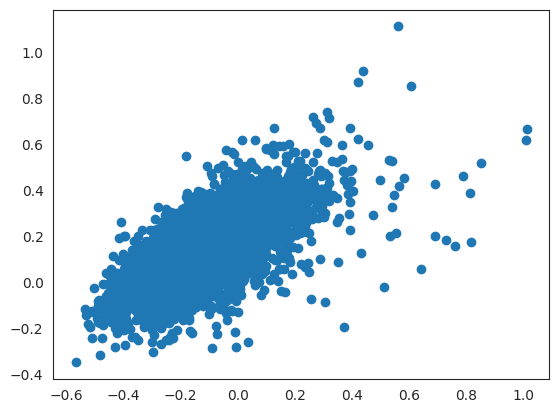

In [ ]:
plt.scatter(model1.A_[:, 0], model1.A_[:, 1], cmap = 'hot')

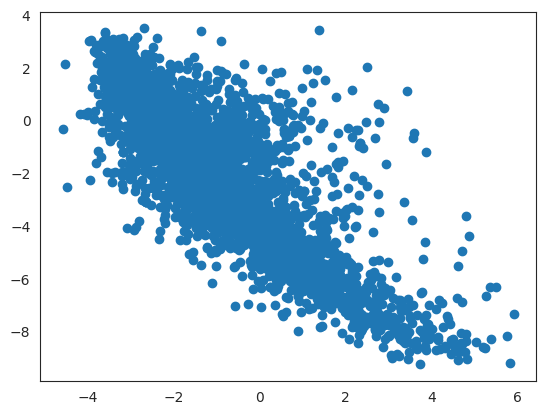

In [ ]:
plt.scatter(model1.B_[:, 0], model1.B_[:, 1], cmap='hot')

** Using Surprise Library:**

In [ ]:
!pip install surprise

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 3.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scikit-surprise: filename=scikit_surprise-1.1.4-cp311-cp311-linux_x86_64.whl size=2505172 sha256=86d49a83d2d48590206377494b44a2274271e0dc9b2baaa26281daac8dbe9748
  Stored in directory: /root/.cache/pip/wheels/2a/8f/6e/7e2899163e2d85d8266daab4aa1cdabec7a6c56f83c015b5af
Successfully built scikit-surprise


In [ ]:
from surprise import Reader, SVD, Dataset
from surprise.model_selection import cross_validate

In [ ]:
##The Reader class is used to parse a file containing ratings.It orders the data in format of (userid,title,rating) and even by
##considering the rating scale
user_itm = data[['UserID', 'Title', 'Rating']].copy()
reader = Reader(rating_scale=(1,5))
data1 = Dataset.load_from_df(user_itm[['UserID', 'Title', 'Rating']], reader)

In [ ]:
data.Rating.value_counts()

,count
Rating,
4,348971
3,261197
5,226310
2,107557
1,56174


In [ ]:
svd = SVD(n_factors=4)
cross_validate(svd, data1, measures=['rmse'], cv=3, return_train_measures=True)
##The dataset is divided into train and test and with 3 folds the rmse has been calculated

{'test_rmse': array([0.89000177, 0.89065882, 0.89194806]),
 'train_rmse': array([0.86199743, 0.86043733, 0.86282642]),
 'fit_time': (15.355595827102661, 7.964092493057251, 8.207942485809326),
 'test_time': (9.857470035552979, 2.4141600131988525, 3.1888933181762695)}

In [ ]:
print(user_itm.shape)
print("No.of Users:",len(user_itm['UserID'].unique()))
print("No.of Items:",len(user_itm['Title'].unique()))

(1000209, 3)
No.of Users: 6040
No.of Items: 3664


In [ ]:
trainset = data1.build_full_trainset()
svd.fit(trainset) ##Fitting the trainset with the help of svd

In [ ]:
svd.pu.shape , svd.qi.shape #pu gives the embeddings of Users and qi gives the embeddings of Items.


((6040, 4), (3664, 4))

In [ ]:
#Storing all the movie titles in items
items = movies['Title'].unique()
##Considering the user '662'
test = [[662, iid, 4] for iid in items]
##Finding the user predictions(ratings) for all the movies
predictions = svd.test(test)
pred = pd.DataFrame(predictions)

In [ ]:
a = pred.sort_values(by='est', ascending=False) ##Sorting the values based on the estimated predictions


In [ ]:
a[0:10] ##TOP 10


,uid,iid,r_ui,est,details
0,662,Title,4,3.58,{'was_impossible': False}
2609,662,Buena Vista Social Club (1999),4,3.58,{'was_impossible': False}
2581,662,Son of Frankenstein (1939),4,3.58,{'was_impossible': False}
2582,662,"Ghost of Frankenstein, The (1942)",4,3.58,{'was_impossible': False}
2583,662,Frankenstein Meets the Wolf Man (1943),4,3.58,{'was_impossible': False}
2584,662,"Curse of Frankenstein, The (1957)",4,3.58,{'was_impossible': False}
2585,662,Son of Dracula (1943),4,3.58,{'was_impossible': False}
2586,662,"Wolf Man, The (1941)",4,3.58,{'was_impossible': False}
2587,662,Howling II: Your Sister Is a Werewolf (1985),4,3.58,{'was_impossible': False}
2588,662,Tarantula (1955),4,3.58,{'was_impossible': False}


**Embeddings for user-user similarity using surprise library.**

In [ ]:
user=cosine_similarity(svd.pu)

user_sim_matrix = pd.DataFrame(user, index=mat.index, columns=mat.index)
user_sim_matrix.head()  #User similarity matrix using the embeddings from matrix factorization

UserID     1    10   100  1000  1001  1002  1003  1004  1005  1006  1007  \
UserID                                                                     
1       1.00  0.86 -0.62 -0.74  0.78  0.04 -0.08 -0.75 -0.10  0.38  0.10   
10      0.86  1.00 -0.84 -0.52  0.97 -0.38  0.40 -0.36 -0.10  0.68 -0.19   
100    -0.62 -0.84  1.00  0.59 -0.88  0.65 -0.36  0.17  0.44 -0.81 -0.14   
1000   -0.74 -0.52  0.59  1.00 -0.57  0.12  0.48  0.63  0.25 -0.11 -0.70   
1001    0.78  0.97 -0.88 -0.57  1.00 -0.56  0.42 -0.20 -0.01  0.62 -0.13   

UserID  1008  1009   101  1010  1011  1012  1013  1014  1015  1016  1017  \
UserID                                                                     
1       0.30  0.03  0.68  0.63  0.62  0.27 -0.99  0.62  0.63  0.40  0.71   
10      0.17  0.01  0.49  0.66  0.66  0.36 -0.91  0.83  0.45  0.68  0.88   
100     0.30  0.33  0.04 -0.24 -0.17  0.09  0.64 -0.74 -0.25 -0.47 -0.54   
1000    0.34  0.09 -0.13 -0.24  0.03  0.45  0.64 -0.50 -0.72 -0.13 -0.18   
1001   -0.04  0.11  0.34  0.68  0.56  0.20 -0.82  0.93  0.55  0.78  0.85   

UserID  1018  1019   102  1020  1021  1022  1023  1024  1025  1026  1027  \
UserID                                                                     
1       0.14 -0.42  0.11 -0.58  0.16  0.59 -0.52  0.61  0.56  0.00  0.23   
10     -0.02 -0.75  0.59 -0.82 -0.26  0.52 -0.37  0.50  0.67  0.07  0.59   
100    -0.39  0.49 -0.68  0.63  0.12 -0.18  0.40 -0.04 -0.40  0.37 -0.41   
1000   -0.65 -0.12  0.02  0.01 -0.68  0.03  0.35 -0.26 -0.36  0.43  0.08   
1001    0.01 -0.74  0.70 -0.70 -0.22  0.30 -0.19  0.50  0.76  0.08  0.68   

UserID  1028  1029   103  1030  1031  1032  1033  1034  1035  1036  1037  \
UserID                                                                     
1      -0.95  0.42  0.33  0.32  0.14 -0.67  0.40 -0.54 -0.48  0.24 -0.08   
10     -0.92  0.19  0.68  0.42  0.62 -0.82  0.67 -0.79 -0.32 -0.12 -0.26   
100     0.66 -0.28 -0.88  0.07 -0.63  0.42 -0.36  0.47  0.43  0.38 -0.17   
1000    0.51 -0.42 -0.42  0.26  0.13  0.10  0.27  0.02  0.43  0.05 -0.43   
1001   -0.81  0.02  0.81  0.38  0.69 -0.77  0.56 -0.79 -0.16 -0.35 -0.26   

UserID  1038  1039   104  1040  1041  1042  1043  1044  1045  1046  1047  \
UserID                                                                     
1      -0.45  0.17  0.54  0.00  0.67 -0.30  0.74 -0.75 -0.28  0.60 -0.73   
10     -0.30 -0.23  0.08  0.16  0.72 -0.73  0.78 -0.78 -0.07  0.90 -0.78   
100     0.02  0.17  0.03  0.28 -0.35  0.84 -0.77  0.63 -0.48 -0.86  0.34   
1000   -0.07 -0.66 -0.58  0.62 -0.34  0.08 -0.45  0.28 -0.18 -0.23  0.17   
1001   -0.06 -0.15 -0.06  0.08  0.75 -0.78  0.66 -0.62  0.04  0.86 -0.72   

UserID  1048  1049   105  1050  1051  1052  1053  1054  1055  1056  1057  \
UserID                                                                     
1       0.21 -0.50 -0.58 -0.08 -0.47 -0.12 -0.90  0.31  0.43 -0.70 -0.01   
10      0.30 -0.32 -0.38 -0.00 -0.76 -0.51 -0.95  0.54  0.08 -0.27 -0.29   
100     0.14  0.59  0.29  0.38  0.60  0.26  0.85 -0.16 -0.15  0.12 -0.02   
1000    0.20  0.90  0.82  0.36  0.23 -0.44  0.76  0.38 -0.54  0.83 -0.65   
1001    0.33 -0.35 -0.49  0.06 -0.86 -0.48 -0.96  0.44 -0.06 -0.24 -0.18   

UserID  1058  1059   106  1060  1061  1062  1063  1064  1065  1066  1067  \
UserID                                                                     
1      -0.24 -0.53  0.64 -0.27 -0.00  0.14  0.26  0.52 -0.46  0.48 -0.64   
10     -0.52 -0.20  0.79 -0.25 -0.16  0.20  0.32  0.79 -0.80  0.70 -0.90   
100     0.70  0.03 -0.39 -0.27  0.61  0.29  0.19 -0.88  0.59 -0.31  0.64   
1000    0.46  0.30 -0.00 -0.25  0.24  0.39  0.37 -0.26 -0.01  0.16  0.14   
1001   -0.71  0.02  0.70 -0.21 -0.16  0.17  0.24  0.73 -0.81  0.63 -0.88   

UserID  1068  1069   107  1070  1071  1072  1073  1074  1075  1076  1077  \
UserID                                                                     
1       0.26 -0.33 -0.39  0.12  0.58 -0.58 -0.19  0.73 -0.88  0.02  0.26   
10      0.24 -0.10 -0.74  0.47  0.59 -0.8

In [ ]:
itm=cosine_similarity(svd.qi)

itm_sim_matrix = pd.DataFrame(itm) #, columns=user_itm['Title'].unique())
itm_sim_matrix.head()#Item similarity matrix using the embeddings from matrix factorization


0     1     2     3     4     5     6     7     8     9     10    11    \
0  1.00  0.05  0.12  0.08 -0.07 -0.69  0.17 -0.22 -0.08  0.17  0.48 -0.27   
1  0.05  1.00  0.90  0.27  0.91 -0.45  0.26  0.95  0.93  0.64  0.68  0.91   
2  0.12  0.90  1.00  0.07  0.87 -0.29  0.13  0.85  0.96  0.76  0.85  0.70   
3  0.08  0.27  0.07  1.00  0.50 -0.71  0.98  0.10  0.26 -0.54  0.29  0.43   
4 -0.07  0.91  0.87  0.50  1.00 -0.45  0.52  0.85  0.97  0.38  0.75  0.88   

   12    13    14    15    16    17    18    19    20    21    22    23    \
0 -0.17  0.17 -0.11 -0.43  0.21 -0.67  0.27 -0.51  0.04  0.06 -0.28 -0.62   
1  0.62 -0.81  0.96 -0.55 -0.13 -0.13  0.39  0.57 -0.28  0.91  0.89  0.61   
2  0.48 -0.94  0.87 -0.36 -0.35  0.10  0.69  0.66 -0.46  0.98  0.91  0.61   
3  0.86 -0.10  0.42 -0.87  0.89 -0.68 -0.61  0.32 -0.58 -0.08  0.16  0.35   
4  0.84 -0.89  0.98 -0.63  0.06 -0.10  0.25  0.80 -0.63  0.80  0.92  0.81   

   24    25    26    27    28    29    30    31    32    33    34    35    \
0 -0.20  0.19 -0.37  0.23 -0.18 -0.10  0.16 -0.39  0.19  0.88  0.14 -0.28   
1 -0.94  0.34  0.53  0.09 -0.44 -0.04  0.90 -0.36 -0.45  0.02  0.03 -0.57   
2 -0.98 -0.04  0.50 -0.32 -0.78 -0.40  0.94 -0.52 -0.19 -0.11 -0.38 -0.86   
3 -0.22  0.81  0.70  0.42  0.34  0.81  0.39 -0.62  0.31  0.10  0.60  0.25   
4 -0.91  0.33  0.82 -0.08 -0.46  0.07  0.96 -0.62 -0.11 -0.21 -0.05 -0.55   

   36    37    38    39    40    41    42    43    44    45    46    47    \
0 -0.08 -0.19  0.57 -0.20 -0.43 -0.06 -0.05 -0.23 -0.23 -0.12 -0.50  0.29   
1 -0.93  0.87  0.35  0.11 -0.69 -0.09 -0.66  0.85 -0.21  0.65 -0.51  0.72   
2 -0.74  0.84  0.07 -0.32 -0.91 -0.50 -0.76  0.90 -0.52  0.57 -0.23  0.65   
3 -0.11  0.49  0.12  0.24  0.10  0.13  0.54 -0.17 -0.27  0.81 -0.77  0.78   
4 -0.71  0.99  0.04 -0.08 -0.63 -0.31 -0.41  0.76 -0.49  0.89 -0.48  0.86   

   48    49    50    51    52    53    54    55    56    57    58    59    \
0  0.62 -0.28  0.47  0.39  0.05 -0.80 -0.53 -0.61 -0.38 -0.17 -0.01 -0.27   
1 -0.70 -0.73 -0.69 -0.04  0.64  0.10  0.79  0.20 -0.28 -0.35  0.30  0.74   
2 -0.69 -0.52 -0.65 -0.39  0.61 -0.22  0.76  0.02 -0.61 -0.48 -0.03  0.83   
3 -0.14 -0.82 -0.51  0.15  0.80  0.18  0.14 -0.49  0.60  0.78  0.94  0.35   
4 -0.79 -0.79 -0.89 -0.31  0.87  0.09  0.84 -0.05 -0.16 -0.03  0.43  0.92   

   60    61    62    63    64    65    66    67    68    69    70    71    \
0  0.17 -0.47 -0.44 -0.58 -0.51 -0.29  0.23 -0.08 -0.10 -0.19  0.16 -0.43   
1  0.20  0.41  0.83  0.77  0.80  0.29  0.32 -0.04  0.23  0.89 -0.57  0.03   
2  0.37  0.66  0.83  0.72  0.67 -0.01 -0.08  0.10  0.32  0.95 -0.78  0.01   
3  0.65 -0.17  0.17  0.04 -0.03  0.91  0.61 -0.97 -0.86  0.11 -0.24  0.75   
4  0.55  0.56  0.89  0.77  0.69  0.48  0.20 -0.33 -0.08  0.91 -0.79  0.41   

   72    73    74    75    76    77    78    79    80    81    82    83    \
0 -0.31  0.56 -0.46 -0.57 -0.58 -0.53 -0.88 -0.02 -0.10  0.18  0.42 -0.55   
1  0.59  0.80  0.31  0.05 -0.42  0.26 -0.36 -0.74 -0.46  0.20  0.25 -0.28   
2  0.74  0.74  0.05 -0.34 -0.71  0.38 -0.41 -0.63 -0.58  0.35  0.44 -0.38   
3  0.32  0.03 -0.33  0.44  0.34  0.44 -0.42 -0.81 -0.66 -0.86 -0.75 -0.68   
4  0.83  0.56  0.03  0.06 -0.32  0.61 -0.36 -0.91 -0.75 -0.12 -0.05 -0.50   

   84    85    86    87    88    89    90    91    92    93    94    95    \
0 -0.53 -0.06 -0.32 -0.73  0.47  0.74 -0.51 -0.44 -0.18  0.46 -0.34 -0.29   
1  0.25  0.94  0.76  0.61 -0.77 -0.27  0.48 -0.80  0.93  0.10 -0.50  0.54   
2  0.39  0.83  0.89  0.44 -0.56 -0.31  0.41 -0.93  0.93 -0.26 -0.82  0.16   
3  0.38  0.53 -0.05  0.30 -0.54  0.55  0.67  0.08  0.25  0.36  0.23  0.71   
4  0.59  0.98  0.81  0.69 -0.85 -0.18  0.76 -0.67  0.96 -0.11 -0.51  0.56   

   96    97    98    99    100   101   102   103   104   105   106   107   \
0  0.25 -0.40  0.08 -0.49 -0.54 -0.37 -0.40 -0.72  0.85 -0.89 -0.08 -0.33   
1 -0.77  0.68 -0.91  0.46  0.15  0.13 -0.29 -0.40  0.56  0.17 -0.17 -0.84   
2 -0.91  0.61 -0.92  0.09  0.35  0.40 -0.11 -0.62  0.56  0.03  0.26 

In [ ]:
# Get movie ID for 'Liar Liar'
movie_name='Home Alone'
movie_id =586

# Use movie ID to access ratings from itm_sim_matrix
movie_rating = itm_sim_matrix[movie_id]
print(movie_rating)

0       0.21
1       0.97
2       0.87
3       0.16
4       0.80
        ... 
3659    0.52
3660   -0.88
3661   -0.83
3662   -0.87
3663    0.01
Name: 586, Length: 3664, dtype: float64


In [ ]:
similar_movies = itm_sim_matrix.corrwith(movie_rating) #Finding similar movies

sim_df = pd.DataFrame(similar_movies, columns=['Correlation'])
sim_df.sort_values('Correlation', ascending=False, inplace=True) # Sorting the values based on correlation

sim_df.iloc[1: , :].head() #Top 5 correlated movies.

,Correlation
975,0.99
2245,0.99
3473,0.99
369,0.99
2659,0.98


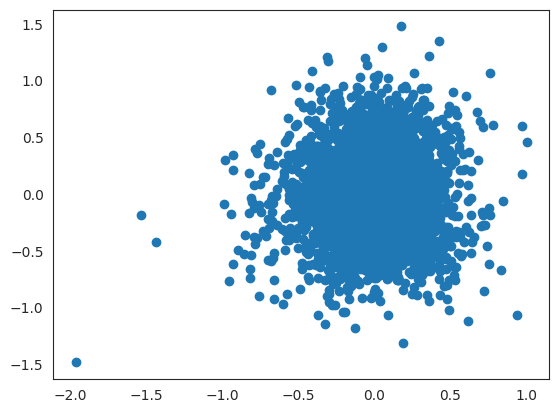

In [ ]:
plt.scatter(svd.pu[:, 0], svd.pu[:, 1], cmap = 'hot')


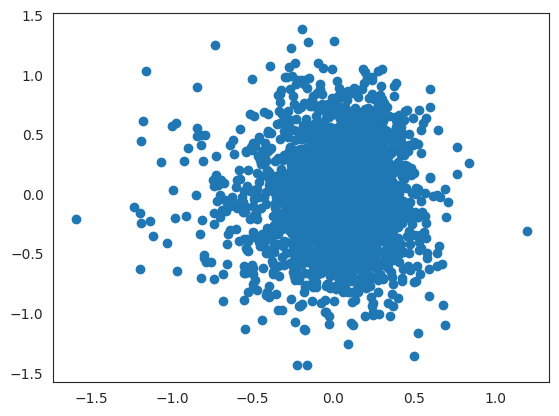

In [ ]:
plt.scatter(svd.qi[:, 0], svd.qi[:, 1], cmap = 'hot')


** User-Based Approach(optional):**

In [ ]:
#Taking 6 movies names in random
mov_name = ['Hamlet', 'Dumb & Dumber', 'Ace Ventura: Pet Detective', 'Home Alone','Robin Hood','It Happened One Night']

In [ ]:
#Finding the MovieID's for the above movies
mov_id = []
for mov in mov_name:
    id = data[data['Title'] == mov]['MovieID'].iloc[0]
    mov_id.append(id)

In [ ]:
#mov_rating = list(map(int, input("Rate these movies respectively: ").split()))
mov_rating = [5,3,2,1,4,3]#Give the random user rating for the movies

In [ ]:
user_choices = pd.DataFrame({'MovieID': mov_id, 'Title': mov_name, 'Rating': mov_rating})
user_choices.sort_values(by='MovieID') #User choices

,MovieID,Title,Rating
0,1411,Hamlet,5
1,231,Dumb & Dumber,3
4,3034,Robin Hood,4
2,344,Ace Ventura: Pet Detective,2
3,586,Home Alone,1
5,905,It Happened One Night,3


In [ ]:
other_users = data[data['MovieID'].isin(user_choices['MovieID'].values)] #Finding the similar users who watched same movies
other_users = other_users[['UserID', 'MovieID', 'Rating']]
other_users['UserID'].nunique()

1810

In [ ]:
common_movies = other_users.groupby(['UserID']) #Grouping the data based on User who watched the common movies
common_movies = sorted(common_movies, key=lambda x: len(x[1]), reverse=True) #Soring the data so that who watched more number of common movies comes at the top.
common_movies[0]

(('1605',),
        UserID MovieID  Rating
 60910    1605     231       2
 92310    1605     344       3
 156847   1605     586       3
 216150   1605     905       4
 418869   1605    1411       3
 814313   1605    3034       4)

In [ ]:
top_users = common_movies[:100] #Taking top 100 users who watched same movies as in user choices.


In [ ]:
from scipy.stats.stats import pearsonr
#Calculating pearson correlation
pearson_corr = {}

for user_id, movies in top_users:
    movies = movies.sort_values(by='MovieID')
    movie_list = movies['MovieID'].values #Taking list of movieid's

    new_user_ratings = user_choices[user_choices['MovieID'].isin(movie_list)]['Rating'].values # Taking the new user rating values based on user choices
    user_ratings = movies[movies['MovieID'].isin(movie_list)]['Rating'].values #Taking the actual rating values of the movies

    corr = pearsonr(new_user_ratings, user_ratings) # Calculating the correlation
    pearson_corr[user_id] = corr[0] #Correlation value for each UserID

In [ ]:
pearson_df = pd.DataFrame(columns=['UserID', 'Similarity Index'], data=pearson_corr.items()) # Creating a dataframe for UserId and Correlation values as 'Similarity Index'
pearson_df = pearson_df.sort_values(by='Similarity Index', ascending=False)[:10] #Showing for top 10 Users
pearson_df

,UserID,Similarity Index
99,"(3756,)",0.97
67,"(2109,)",0.97
87,"(3224,)",0.94
66,"(2106,)",0.87
40,"(1019,)",0.87
13,"(2288,)",0.87
27,"(48,)",0.87
70,"(2507,)",0.85
22,"(4016,)",0.80
31,"(5530,)",0.76


In [ ]:
users_rating = pearson_df.merge(data, on='UserID', how='inner') #Merging the original data with pearson correlation values
users_rating['Weighted Rating'] = users_rating['Rating'] * users_rating['Similarity Index'] # Calculating the Weighed rating for each user and movie
users_rating = users_rating[['UserID', 'MovieID', 'Rating', 'Similarity Index', 'Weighted Rating']]
users_rating

,UserID,MovieID,Rating,Similarity Index,Weighted Rating


In [ ]:
# Calculate sum of similarity index and weighted rating for each movie
grouped_ratings = users_rating.groupby('MovieID').sum()[['Similarity Index', 'Weighted Rating']]

recommend_movies = pd.DataFrame()

# Add average recommendation score.
# We're calculating average recommendation score by dividing the Weighted Rating by the Similarity Index.
recommend_movies['avg_reccomend_score'] = grouped_ratings['Weighted Rating']/grouped_ratings['Similarity Index']
recommend_movies['MovieID'] = grouped_ratings.index
recommend_movies = recommend_movies.reset_index(drop=True)

# Select movies with the highest score i.e. 5
recommend_movies = recommend_movies[(recommend_movies['avg_reccomend_score'] == 5)]

In [ ]:
recommendations = data[data['MovieID'].isin(recommend_movies['MovieID'])][['MovieID', 'Title']]
recommendations

,MovieID,Title


We've given our user 4 (four) movie names and asked them to rate these movies according to their liking.

In [ ]:
mov_name = ['Mrs. Doubtfire', 'Dumb & Dumber', 'Ace Ventura: Pet Detective', 'Home Alone']

In [ ]:
mov_id = []
for mov in mov_name:
    id = data[data['Title'] == mov]['MovieID'].iloc[0]
    mov_id.append(id)

In [ ]:
mov_rating = list(map(int, input("Rate these movies respectively: ").split()))

Rate these movies respectively: 3 4 5 4


Creating a dataframe for a new user's choices.

In [ ]:
len(mov_rating),len(mov_id),len(mov_name)

(4, 4, 4)

In [ ]:
user_choices = pd.DataFrame({'MovieID': mov_id,
                            'Title': mov_name,
                            'Rating': mov_rating})
user_choices.sort_values(by='MovieID')

,MovieID,Title,Rating
1,231,Dumb & Dumber,4
2,344,Ace Ventura: Pet Detective,5
0,500,Mrs. Doubtfire,3
3,586,Home Alone,4


Users who have watched the same movies as the new users.

In [ ]:
other_users = data[data['MovieID'].isin(user_choices['MovieID'].values)]
other_users = other_users[['UserID', 'MovieID', 'Rating']]
other_users['UserID'].nunique()

1466

Sorting old users by the count of most movies in common with the new user.

In [ ]:
other_users

,UserID,MovieID,Rating
60737,11,231,3
60738,15,231,2
60739,22,231,3
60740,26,231,1
60741,48,231,4
...,...,...,...
157330,5991,586,3
157331,5996,586,3
157332,6000,586,3
157333,6006,586,2


In [ ]:
common_movies = other_users.groupby(['UserID'])
common_movies = sorted(common_movies, key=lambda x: len(x[1]), reverse=True)
common_movies[0]

(('1010',),
        UserID MovieID  Rating
 60843    1010     231       4
 92231    1010     344       4
 135441   1010     500       2
 156775   1010     586       4)

In [ ]:
top_users = common_movies[:100]
top_users

[(('1010',),
         UserID MovieID  Rating
  60843    1010     231       4
  92231    1010     344       4
  135441   1010     500       2
  156775   1010     586       4),
 (('1019',),
         UserID MovieID  Rating
  60845    1019     231       3
  92233    1019     344       3
  135444   1019     500       2
  156776   1019     586       1),
 (('1050',),
         UserID MovieID  Rating
  60847    1050     231       4
  92235    1050     344       3
  135446   1050     500       3
  156778   1050     586       2),
 (('1051',),
         UserID MovieID  Rating
  60848    1051     231       3
  92236    1051     344       4
  135447   1051     500       4
  156779   1051     586       2),
 (('1059',),
         UserID MovieID  Rating
  60849    1059     231       1
  92237    1059     344       2
  135448   1059     500       1
  156781   1059     586       2),
 (('1088',),
         UserID MovieID  Rating
  60851    1088     231       1
  92241    1088     344       3
  135452   1088 

In [ ]:
pearson_corr = {}

for user_id, movies in top_users:
    movies = movies.sort_values(by='MovieID')
    movie_list = movies['MovieID'].values

    new_user_ratings = user_choices[user_choices['MovieID'].isin(movie_list)]['Rating'].values
    user_ratings = movies[movies['MovieID'].isin(movie_list)]['Rating'].values

    corr = pearsonr(new_user_ratings, user_ratings)
    pearson_corr[user_id] = corr[0]

Get top 10 users with the highest similarity indices.

In [ ]:
pearson_df = pd.DataFrame(columns=['UserID', 'Similarity Index'], data=pearson_corr.items())


pearson_df = pearson_df.sort_values(by='Similarity Index', ascending=False)[:10]
pearson_df

,UserID,Similarity Index
10,"(1173,)",1.00
12,"(1207,)",1.00
74,"(2847,)",1.00
27,"(1605,)",1.00
93,"(3272,)",1.00
25,"(1516,)",0.97
41,"(1941,)",0.95
97,"(3308,)",0.85
11,"(1184,)",0.85
68,"(26,)",0.85


In [ ]:
pearson_df.dtypes

,0
UserID,object
Similarity Index,float64


In [ ]:
# prompt: convert pearson_df.UserID to int

pearson_df['UserID']=pearson_df['UserID'].astype(str).str.replace(r'[(),]', '', regex=True)
pearson_df['UserID']=pearson_df['UserID'].str.lstrip("'").str.rstrip("'")

pearson_df['UserID']


,UserID
10,1173
12,1207
74,2847
27,1605
93,3272
25,1516
41,1941
97,3308
11,1184
68,26


In [ ]:
pearson_df['UserID']=pearson_df['UserID'].astype('object')
pearson_df.dtypes

,0
UserID,object
Similarity Index,float64


In [ ]:
pearson_df.dtypes

,0
UserID,object
Similarity Index,float64


In [ ]:
data.dtypes

,0
MovieID,object
Title,object
Genres,object
UserID,object
Rating,int32
Timestamp,object
Gender,object
Age,object
Occupation,object
Zip-code,object


In [ ]:
users_rating = pearson_df.merge(data, on='UserID', how='inner')
users_rating['Weighted Rating'] = users_rating['Rating'] * users_rating['Similarity Index']
users_rating = users_rating[['UserID', 'MovieID', 'Rating', 'Similarity Index', 'Weighted Rating']]
users_rating.head()

,UserID,MovieID,Rating,Similarity Index,Weighted Rating
0,1173,4,3,1.00,3.00
1,1173,5,3,1.00,3.00
2,1173,11,5,1.00,5.00
3,1173,16,4,1.00,4.00
4,1173,19,3,1.00,3.00


Calculating average recommendation score and selecting items with the highest score.

In [ ]:
# Calculate sum of similarity index and weighted rating for each movie
grouped_ratings = users_rating.groupby('MovieID').sum()[['Similarity Index', 'Weighted Rating']]

recommend_movies = pd.DataFrame()

# Add average recommendation score.
# We're calculating average recommendation score by dividing the Weighted Rating by the Similarity Index.
recommend_movies['avg_reccomend_score'] = grouped_ratings['Weighted Rating']/grouped_ratings['Similarity Index']
recommend_movies['MovieID'] = grouped_ratings.index
recommend_movies = recommend_movies.reset_index(drop=True)

# Select movies with the highest score i.e. 5
recommend_movies = recommend_movies[(recommend_movies['avg_reccomend_score'] == 5)]

In [ ]:
recommendations = data[data['MovieID'].isin(recommend_movies['MovieID'])][['MovieID', 'Title']].sample(10)
recommendations

,MovieID,Title
307731,1203,12 Angry Men
745215,2761,"Iron Giant, The"
50819,175,Kids
388782,1340,Bride of Frankenstein
356863,1266,Unforgiven
309507,1206,"Clockwork Orange, A"
133498,492,Manhattan Murder Mystery
235636,950,"Thin Man, The"
711038,2644,Dracula
356677,1266,Unforgiven


**Questionnaire:**

1. Users of which age group have watched and rated the most number of movies? :- 25-34 age group

2. Users belonging to which profession have watched and rated the most movies? :- college/grad student

3. Most of the users in our dataset who’ve rated the movies are Male. (T/F):- True

4. Most of the movies present on our dataset were released in which decade? :- b.90s

5. The movie with maximum no. of ratings is ___ :- American Beauty

6. Name the top 3 movies similar to ‘Liar Liar’ on the item-based approach. :- Mrs. Doubtfire, Ace Ventura: Pet, Detective Dumb & Dumber

7. On the basis of approach, Collaborative Filtering methods can be classified into Memory-based and Model-based.

8. Pearson Correlation ranges between -1 to 1 whereas, Cosine Similarity belongs to the interval between 0 to 1

9. Mention the RMSE and MAPE that you got while evaluating the Matrix Factorization model.:- Root Mean Squared Error: 2.111
Mean Absolute Percentage Error: 0.418

10. Give the sparse ‘row’ matrix representation for the following dense matrix - [[1 0],[ 3 7]]

In [ ]:
from scipy.sparse import csr_matrix
# create dense matrix
A = np.array([[1,0],[3,7]])
# convert to sparse matrix (CSR method)
S = csr_matrix(A)
print(S)

  (0, 0)	1
  (1, 0)	3
  (1, 1)	7
